In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import drive
from sklearn.preprocessing import StandardScaler
from  sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
#!pip install tensorflow
import cv2
from PIL import Image
import tensorflow as tf 
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
import joblib
sns.set

<function seaborn.rcmod.set>


# Archive

Importer les fichiers utiles

In [ ]:
drive.mount('/content/drive/') #Load df_final -> mélange de donnée tranformée et leurs catégories (mais imprécis)
%cp -av "/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp/df_final.csv" "/content/"

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
cp: cannot stat '/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp/df_final.csv': No such file or directory


In [ ]:
drive.mount('/content/drive/')
%cp -av "/content/drive/MyDrive//ProjetMastercamp/df_final.csv" "/content/"

Data cleaning

In [ ]:
df_final = pd.read_csv('df_final.csv')

#rendre les covid status positifs différents -> covid simple
df_final.loc[df_final.covid_status == 'positive_asymp','covid_status']='covid'
df_final.loc[df_final.covid_status == 'positive_mild','covid_status']='covid'
df_final.loc[df_final.covid_status == 'positive_moderate','covid_status']='covid'

#transformer les covid status catégoriques (string) en données numériques(1 ou 0)
df_final['covid_status'] = df_final['covid_status'].astype('category')
df_columns = df_final.select_dtypes(['category']).columns
df_final[df_columns] = df_final[df_columns].apply(lambda x: x.cat.codes)

#resultat dans dataFramePreparation
df_final.to_csv('dataFramePreparation.csv')

FileNotFoundError: ignored

#File loading

Charger les fichiers df complet et test

In [ ]:
drive.mount('/content/drive/') 
%cp -av "/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp/df_3_transform.csv" "/content/"

Mounted at /content/drive/
'/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp/df_3_transform.csv' -> '/content/df_3_transform.csv'


In [3]:
drive.mount('/content/drive/')
%cp -av "/content/drive/MyDrive//ProjetMastercamp/df_3_transform.csv" "/content/"
%cp -av "/content/drive/MyDrive//ProjetMastercamp/test(4).csv" "/content/"

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
'/content/drive/MyDrive//ProjetMastercamp/df_3_transform.csv' -> '/content/df_3_transform.csv'
cp: cannot stat '/content/drive/MyDrive//ProjetMastercamp/test(4).csv': No such file or directory


Instanciation des df correspondant aux fichiers



In [4]:
df = pd.read_csv('df_3_transform.csv', index_col=['Unnamed: 0'])

# Séparer la colonne résultat (Covid ou non) pour l'entrainement
df_target = pd.DataFrame(df['Covid ?'])

#Suppression des colonnes inutiles pour l'analyse (données descriptives)
df = df.drop(columns=['id','Covid ?'])


# Data Visualization

In [ ]:
# Fonctionne pas à expliquer
plt.figure(figsize = (12, 9))
plt.scatter(df.iloc[:,23])


Création de la matrice corrélation

Text(0.5, -0.15, 'Matrice de corrélation')

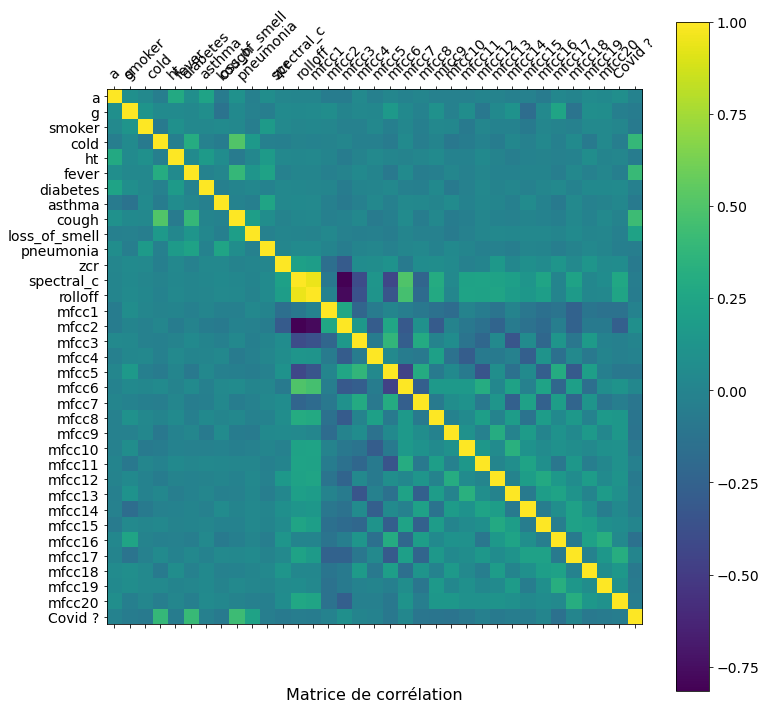

In [ ]:
f = plt.figure(figsize=(12, 12))

# Création de du tableau de correlation
plt.matshow(df.corr(), fignum=f.number) 
plt.xticks(range(df.shape[1]), df.columns, fontsize=14, rotation=45)
plt.yticks(range(df.shape[1]), df.columns, fontsize=14)

# Ajouter une barre de couleurs
cb = plt.colorbar() 
cb.ax.tick_params(labelsize=14)
plt.title('Matrice de corrélation', fontsize=16, y=-0.15)

Matrice de corrélation (avec catégories bonus ex: asthme) sous forme de plot

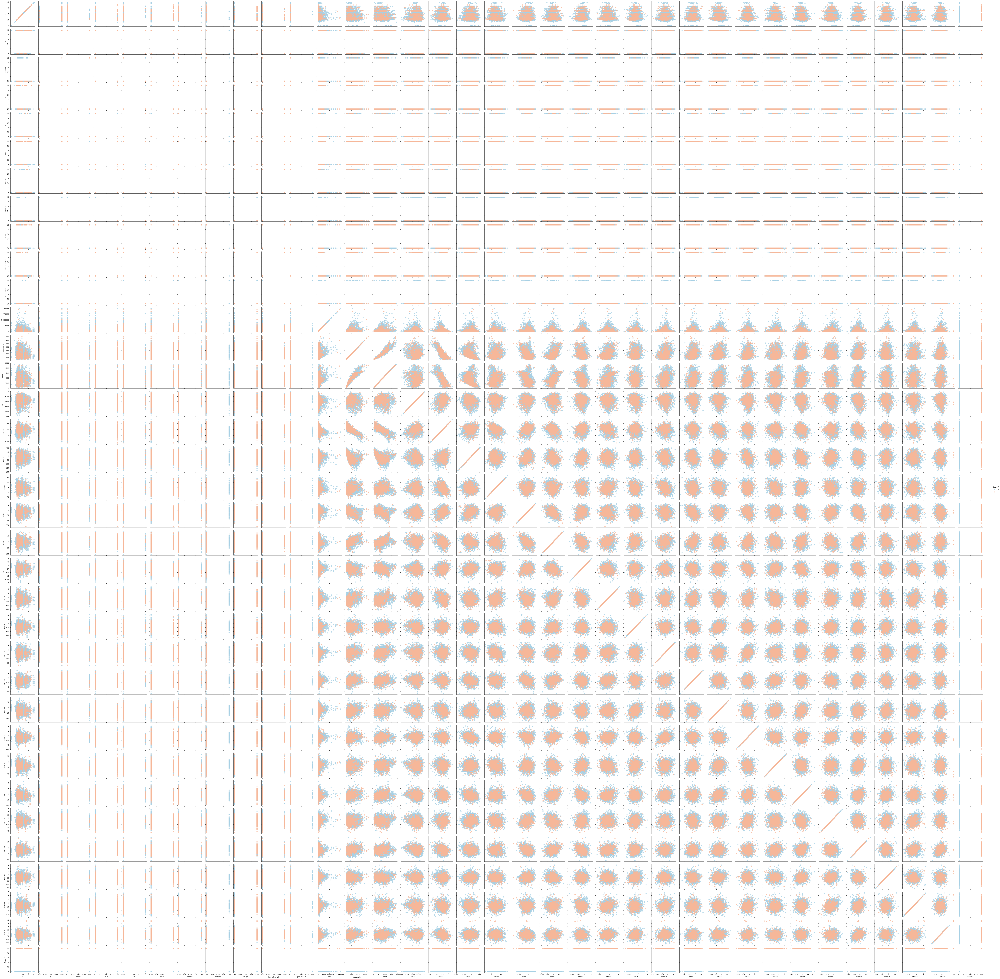

In [ ]:
# Tracer les relations par paires autour des colonnes du df renseignées ci-dessous
g = sns.PairGrid(df, vars=['a', 'g', 'smoker', 'cold', 'ht', 'fever','diabetes', 'asthma', 'cough', 'loss_of_smell', 'pneumonia','zcr', 'spectral_c', 'rolloff', 'mfcc1', 'mfcc2', 'mfcc3',
                'mfcc4', 'mfcc5', 'mfcc6', 'mfcc7', 'mfcc8', 'mfcc9','mfcc10', 'mfcc11', 'mfcc12', 'mfcc13', 'mfcc14', 'mfcc15','mfcc16', 'mfcc17', 'mfcc18', 'mfcc19', 'mfcc20','Covid ?'],
                 hue='Covid ?', palette='RdBu_r')

g.map(plt.scatter, alpha=0.8)
g.add_legend();

sns.pairplot(df, diag_kind = 'kde') 

# Clustering
Standardisation et séparation de df

In [6]:
scaler = StandardScaler()

# Séparer les données supervisées -> df_data_supervised (ex: asthme,pneumonie,etc.) des autres
df_data_supervised = pd.DataFrame(df.iloc[:,:12])
print(df_data_supervised)
# Normaliser les données (non-supervisée -> df_data_clustering) autour de 0
df_data_clustering = pd.DataFrame(scaler.fit_transform(df.iloc[:,13:36]))

#export model fit of scaler
joblib.dump(scaler, 'scaler.model')

df_data_clustering

       AGE  GENDER  ...  loss_of_smell  Breathing_Difficulties
0     24.0     1.0  ...            0.0                     0.0
1     24.0     1.0  ...            0.0                     0.0
2     72.0     1.0  ...            0.0                     0.0
3     72.0     1.0  ...            0.0                     0.0
4     54.0     1.0  ...            0.0                     0.0
...    ...     ...  ...            ...                     ...
3183  35.0     0.0  ...            0.0                     0.0
3184  35.0     0.0  ...            0.0                     0.0
3185  35.0     0.0  ...            0.0                     0.0
3186  35.0     0.0  ...            0.0                     0.0
3187  35.0     0.0  ...            0.0                     0.0

[3188 rows x 12 columns]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
0,-0.600071,-0.085106,-0.022544,0.611688,-0.915965,0.827852,-1.090492,0.810416,-0.178944,0.906891,0.623957,0.862141,1.287264,1.194716,0.761131,-0.006664,1.390981,-0.263113,0.952993,-0.131920,0.120824,0.233812,-0.077014
1,-0.947628,-0.924818,-0.800392,0.223065,-0.010567,1.917671,-0.248899,1.767211,0.615944,1.042599,0.321416,0.423477,1.049756,0.509599,0.838847,-0.232662,0.600869,0.655862,1.741604,-0.271112,-0.180104,0.616020,-0.608565
2,0.546011,0.404875,0.384996,-0.411450,-0.974422,0.444396,-0.354094,0.294454,-0.613472,-0.100438,0.217283,0.049598,0.047803,1.137963,0.490456,-0.606482,0.551040,0.963200,0.379849,0.902674,0.210651,0.743012,0.649529
3,0.060150,-0.812176,-0.662278,-1.764634,-1.112226,0.995689,-0.130952,0.379177,-0.355736,0.289173,0.338477,0.572555,-0.217655,0.591698,0.269529,-0.718668,0.348041,0.025569,-0.075937,0.247687,0.423649,-0.006306,0.178680
4,-0.440551,0.287336,-0.017080,0.493652,-0.148685,-2.500229,-0.272623,-0.564436,-0.662767,0.513391,-0.063848,-1.134102,0.368207,0.170308,-0.135969,1.175484,0.061909,0.408677,-0.015517,1.434089,0.398678,0.823159,1.791316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3183,-0.992261,-0.468475,-0.434504,0.389139,0.159129,-0.583013,0.689916,-0.214194,-1.061934,-1.083756,0.439549,-0.397535,0.509778,-0.597338,-2.293270,0.705563,0.198151,1.010680,-0.900843,-0.195503,1.084617,-0.265382,-1.127314
3184,-1.002695,-0.924484,-1.042463,0.447386,0.166438,-1.363750,1.058052,-0.121979,-1.023212,-0.597087,1.476136,-0.523599,-0.297479,-0.844236,-2.156839,1.803778,-0.096513,0.109559,-0.574701,-0.376936,0.280996,-0.402953,-0.527765
3185,-1.071035,-1.446607,-1.365943,-0.512236,-0.853262,-0.054063,0.382193,0.203879,0.680045,0.249401,0.883849,0.774650,-0.653867,0.302544,0.518671,-0.265015,-0.455541,0.586460,-0.217539,-0.267465,0.556699,2.341487,0.093252
3186,-0.985363,-0.751294,-0.857617,0.951884,0.536700,-1.770137,1.231909,-1.538940,0.711612,-0.999795,0.265120,-0.132381,-1.001295,-0.913871,-0.822032,1.265919,-0.502978,0.569236,-1.099476,1.115795,0.861432,2.217337,-1.114663


PCA


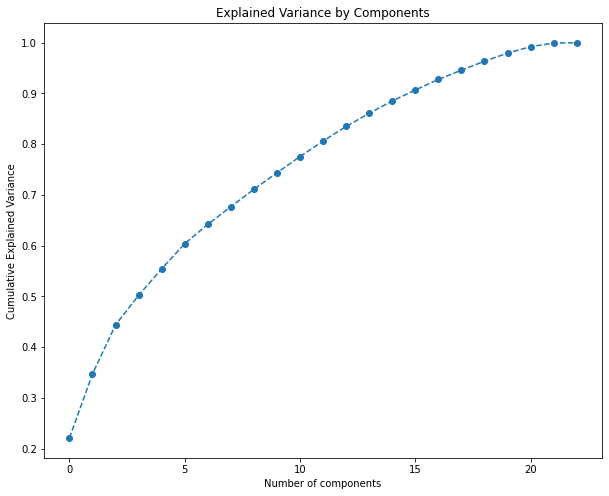

In [ ]:
#Fitting du Principal Component Analysis autour de la donnée non-supervisée 
pca = PCA()
pca.fit(df_data_clustering)

#Visualisation de la perte de donnée en fonction du nombre de composants
plt.figure(figsize = (10,8))
plt.plot(range(0,23), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative Explained Variance')

#Application du nombre de composants choisi
pca = PCA(n_components=13)
pca.fit(df_data_clustering)

#Transformation de la data non-supervisée par PCA
scores_pca = pca.transform(df_data_clustering)
df_data_clustered = pd.DataFrame(scores_pca)

Stockage du modèle de PCA

In [ ]:
#Stockage du modèle de PCA
joblib.dump(pca, 'pca.model')

%cp '/content/pca.model' '/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp'


K-means sur la donnée transformée par le PCA

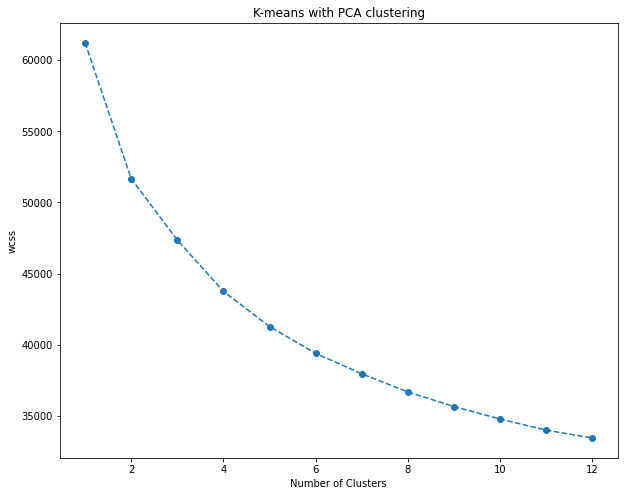

In [ ]:
# Analyse de la data perdue en fonction du nombre de clusters (ou groupe)
wcss = []
for i in range(1,13):
  kmeans_pca = KMeans(n_clusters=i, init="k-means++", random_state=42)
  kmeans_pca.fit(df_data_clustered)
  wcss.append(kmeans_pca.inertia_)

# Affichage de la liste contenant l'analyse
plt.figure(figsize=(10,8))
plt.plot(range(1,13),wcss, marker='o', linestyle = '--')
plt.xlabel('Number of Clusters')
plt.ylabel('wcss')
plt.title('K-means with PCA clustering')
plt.show()

# Choix du nombre de clusters (je n'ai pas gardé le k-means clustering -> trop de perte de data)
kmeans_pca = KMeans(n_clusters=3, init="k-means++", random_state=33).fit(df_data_clustered)

#kmeans_pca.transform()

# ML algorithmes simples
KNN


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


donnée train :  100.0 %
donnée test :  98.43260188087774 % 

 tn =  526 
 fp =  3 
 fn =  7 
 tp =  102 



Text(108.68, 0.5, 'predicted label')

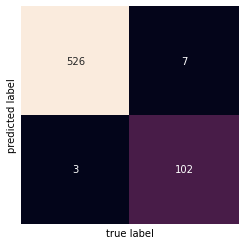

In [ ]:
#Jointure du df entre la donnée supervisée de chaque ligne et la donnée non-supervisée transformée par PCA
df_data = df_data_supervised.join(df_data_clustered)

#Analyse des meilleurs scores du modèle en fonction de
# random state parameter -> fonction train test split / nombre de neighbors parameter -> fontion knn.fit
'''
success = 0
random = 0
neighbors = 0

for i in range(1,40):
  knn = KNeighborsClassifier(i)
  for k in range(1,40):
    X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, test_size=0.2, random_state=k)
    if success < (knn.fit(X_train, y_train).score(X_test, y_test)):
      success = (knn.fit(X_train, y_train).score(X_test, y_test))
      print(success)
      random = i
      neighbors = k
  print(neighbors)
  print(random)
'''

#Application du train test split avec le bon random state
X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, test_size=0.2, random_state=22)

#Application du fitting de l'algo autour du nombre de neighbors
knn = KNeighborsClassifier(1).fit(X_train,y_train)

#Affichage des scores
print("donnée train : ",knn.score(X_train,y_train)*100,"%")
print("donnée test : ",knn.score(X_test,y_test)*100,"%","\n")

#Matrice de confusion
tn, fp, fn, tp = confusion_matrix(y_test, knn.predict(X_test)).ravel()
print(" tn = ",tn,"\n","fp = ",fp,"\n","fn = ",fn,"\n","tp = ",tp,"\n",)

mat = confusion_matrix(y_test, knn.predict(X_test))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False, xticklabels='', yticklabels='')
plt.xlabel('true label')
plt.ylabel('predicted label')

Test predict

In [ ]:
cpt =0
df1 = pd.DataFrame(columns=df_data.columns)

df1.loc[0] = X_train.iloc[2549]
cpt+=1
knn.predict(df1)

array([1.])

Stockage du modèle KNN

In [ ]:
#Stockage du modèle 
joblib.dump(knn, 'knn.model')
%cp '/content/knn.model' '/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp'

#Neural Network 
import le dataset d'images -> np.array

In [ ]:
#Génerer un dataset à partir des dossiers d'images
directory = '/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp/Data/image_toux'

train = tf.keras.preprocessing.image_dataset_from_directory(directory,
     labels='inferred',
    class_names=False, color_mode='rgb', batch_size=8, image_size=(150,
    150), shuffle=True, seed=1, validation_split=.25, subset='training',
    interpolation='bilinear',label_mode='binary')

test = tf.keras.preprocessing.image_dataset_from_directory(directory,
     labels='inferred',
    class_names=False, color_mode='rgb', batch_size=8, image_size=(150,
    150), shuffle=True, seed=1, validation_split=.25, subset='validation',
    interpolation='bilinear',label_mode='binary')

Found 939 files belonging to 2 classes.
Using 705 files for training.
Found 939 files belonging to 2 classes.
Using 234 files for validation.


In [ ]:
model = tf.keras.Sequential()  # Création d'un réseau de neurones vide 
model.add(tf.keras.layers.Conv2D(32, (3, 3), activation="relu"))
model.add(tf.keras.layers.Conv2D(64, (3, 3), activation="relu"))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(500, activation="relu"))
model.add(tf.keras.layers.Dense(200, activation="relu"))
model.add(tf.keras.layers.Dense(2, activation="softmax"))


In [ ]:
model.compile()

In [ ]:
for d in train:
  model.train_on_batch(
    d[0],
    d[1],
    sample_weight=None,
    class_weight=None,
    reset_metrics=True,
    return_dict=False,)




#Ensemble Learning
XGBoost

# Data test


KNN

In [ ]:
#file loading
drive.mount('/content/drive/')
%cp -av "/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp/test.csv" "/content/"

#loading df
df_test = pd.read_csv('test.csv')
df_test = df_test.drop(columns=['Unnamed: 0','id'])
print(df_test['zcr'])
#séparer la target (si besoin)
#df_test_target = df_test["Covid ?"]
#df_test = df_test.drop(columns=["Covid ?"])

# Séparer les données supervisées -> df_data_supervised (ex: asthme,pneumonie,etc.) des autres
df_data_supervised_test = pd.DataFrame(df_test.iloc[:,:12])
print(df_data_supervised_test)

# Normaliser les données (non-supervisée -> df_data_clustering) autour de 0
df_data_clustering_test = pd.DataFrame(scaler.transform(df_test.iloc[:,13:36]))
print(df_data_clustering_test)

#Transformation de la data non-supervisée par PCA
scores_pca_test = pca.transform(df_data_clustering_test)
df_data_clustered_test = pd.DataFrame(scores_pca_test)
print(df_data_clustered_test)

#Jointure du df entre la donnée supervisée de chaque ligne et la donnée non-supervisée transformée par PCA
df_data_test = df_data_supervised_test.join(df_data_clustered_test)
print(df_data_test)

#Prédiction sur échantillon de l'algo knn
print(knn.predict(df_data_test))

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
'/content/drive/MyDrive/Colab Notebooks/# Project/ProjetMastercamp/test.csv' -> '/content/test.csv'
0    24243.0
Name: zcr, dtype: float64
   AGE  GENDER  Diabetes  ...  Muscle_Pain  loss_of_smell  Breathing_Difficulties
0    1       0         1  ...            0              1                       0

[1 rows x 12 columns]
         0        1         2        3   ...        19      20        21        22
0  0.193469  0.96183  0.826815 -0.54172  ...  1.328111  1.4449  1.230065 -0.144999

[1 rows x 23 columns]
         0         1         2   ...        10        11        12
0 -2.401855  0.995691  0.307717  ... -1.235068  0.043611 -0.570618

[1 rows x 13 columns]
   AGE  GENDER  Diabetes  Asthma  ...         9        10        11        12
0    1       0         1       0  ... -0.546942 -1.235068  0.043611 -0.570618

[1 rows x 25 columns]
[0.]


CNN